# Overview

**Notebook Outline:**
*   Data Inspection
*   Preprocessing
- Train and Validation
- Feature Importance

Reference:
- https://www.kaggle.com/code/andreshg/timeseries-analysis-a-complete-guide
- https://www.kaggle.com/code/usharengaraju/wids2023-tabnetregressor 

Upcoming:
- Dim Reduction Using PCA


# Env Setup
- install packages
- download datasets

In [ ]:
!pip install pytorch-tabnet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 KB 1.6 MB/s eta 0:00:00


In [ ]:
!pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.3/365.3 KB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 KB 16.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 KB 7.2 MB/s eta 0:00:00


In [ ]:
# import packages
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from pytorch_tabnet.tab_model import TabNetRegressor

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import optuna
from optuna import Trial, visualization
import torch

import warnings
warnings.filterwarnings('ignore')

from datetime import datetime

import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 18})
plt.style.use('ggplot')
import seaborn as sns
from scipy import stats
from statsmodels.tsa.seasonal import seasonal_decompose

import gc

In [ ]:
!pip install -U --no-cache-dir gdown --pre

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [ ]:
! gdown https://drive.google.com/uc?id=1W9ydq2JOdXY70YplgHMcoamqkpc_QFeu
! gdown https://drive.google.com/uc?id=1xKJzWEdRGADgbY4zPz2ovVcYQQ6vgynT

Downloading...
From: https://drive.google.com/uc?id=1W9ydq2JOdXY70YplgHMcoamqkpc_QFeu
To: /content/test_data.csv.zip
100% 15.9M/15.9M [00:00<00:00, 85.6MB/s]
Downloading...
From (uriginal): https://drive.google.com/uc?id=1xKJzWEdRGADgbY4zPz2ovVcYQQ6vgynT
From (redirected): https://drive.google.com/uc?id=1xKJzWEdRGADgbY4zPz2ovVcYQQ6vgynT&confirm=t&uuid=d96907bc-1223-4e28-b2f7-faee184b173e
To: /content/train_data.csv.zip
100% 197M/197M [00:04<00:00, 45.3MB/s]


In [ ]:
! unzip -qq -o ./test_data.csv.zip

In [ ]:
! unzip -qq -o ./train_data.csv.zip

# Data Inspection

In [ ]:
train_df = pd.read_csv('./train_data.csv')
train_df.head()

,index,lat,lon,startdate,contest-pevpr-sfc-gauss-14d__pevpr,nmme0-tmp2m-34w__cancm30,nmme0-tmp2m-34w__cancm40,nmme0-tmp2m-34w__ccsm30,nmme0-tmp2m-34w__ccsm40,nmme0-tmp2m-34w__cfsv20,...,wind-vwnd-925-2010-11,wind-vwnd-925-2010-12,wind-vwnd-925-2010-13,wind-vwnd-925-2010-14,wind-vwnd-925-2010-15,wind-vwnd-925-2010-16,wind-vwnd-925-2010-17,wind-vwnd-925-2010-18,wind-vwnd-925-2010-19,wind-vwnd-925-2010-20
0,0,0.0,0.833333,9/1/14,237.00,29.02,31.64,29.57,30.73,29.71,...,-27.68,-37.21,8.32,9.56,-2.03,48.13,28.09,-13.50,11.90,4.58
1,1,0.0,0.833333,9/2/14,228.90,29.02,31.64,29.57,30.73,29.71,...,-21.13,-36.57,8.77,21.17,4.44,48.60,27.41,-23.77,15.44,3.42
2,2,0.0,0.833333,9/3/14,220.69,29.02,31.64,29.57,30.73,29.71,...,-10.72,-34.16,6.99,32.16,5.01,48.53,19.21,-33.16,15.11,4.82
3,3,0.0,0.833333,9/4/14,225.28,29.02,31.64,29.57,30.73,29.71,...,0.33,-31.04,6.17,39.66,-1.41,50.59,8.29,-37.22,18.24,9.74
4,4,0.0,0.833333,9/5/14,237.24,29.02,31.64,29.57,30.73,29.71,...,9.83,-31.80,7.47,38.62,-5.21,54.73,-2.58,-42.30,21.91,10.95


In [ ]:
test_df = pd.read_csv('./test_data.csv')
test_df.head()

,index,lat,lon,startdate,contest-pevpr-sfc-gauss-14d__pevpr,nmme0-tmp2m-34w__cancm30,nmme0-tmp2m-34w__cancm40,nmme0-tmp2m-34w__ccsm30,nmme0-tmp2m-34w__ccsm40,nmme0-tmp2m-34w__cfsv20,...,wind-vwnd-925-2010-11,wind-vwnd-925-2010-12,wind-vwnd-925-2010-13,wind-vwnd-925-2010-14,wind-vwnd-925-2010-15,wind-vwnd-925-2010-16,wind-vwnd-925-2010-17,wind-vwnd-925-2010-18,wind-vwnd-925-2010-19,wind-vwnd-925-2010-20
0,375734,0.0,0.833333,11/1/22,339.88,30.88,30.92,29.17,31.02,29.47,...,-19.28,-39.77,-29.25,40.88,-8.31,14.91,-24.62,31.05,-23.69,6.27
1,375735,0.0,0.833333,11/2/22,334.63,30.88,30.92,29.17,31.02,29.47,...,-19.58,-43.14,-28.62,45.37,-5.42,16.97,-23.94,28.84,-20.61,14.16
2,375736,0.0,0.833333,11/3/22,337.83,30.88,30.92,29.17,31.02,29.47,...,-13.73,-44.22,-27.67,49.76,-1.31,21.44,-19.06,26.85,-16.78,13.42
3,375737,0.0,0.833333,11/4/22,345.81,30.88,30.92,29.17,31.02,29.47,...,-7.97,-49.47,-19.32,52.62,-0.44,21.65,-23.12,23.70,-18.62,10.69
4,375738,0.0,0.833333,11/5/22,357.39,30.88,30.92,29.17,31.02,29.47,...,-0.80,-56.07,-9.89,51.23,-7.57,19.86,-30.56,20.66,-25.08,19.64


In [ ]:
trial = train_df.iloc[:, :50]
trial.shape
target = 'contest-tmp2m-14d__tmp2m'
trial['target'] = train_df[target][:]

**Correlation Check**

- nmme0 and nmme-tmp2m-34w models highly correlate vs each others and highly correlate with target
- contest-wind-h100 highly correlate with nmme0 model and target

=> merge these columns into a new one and create lag series on that.

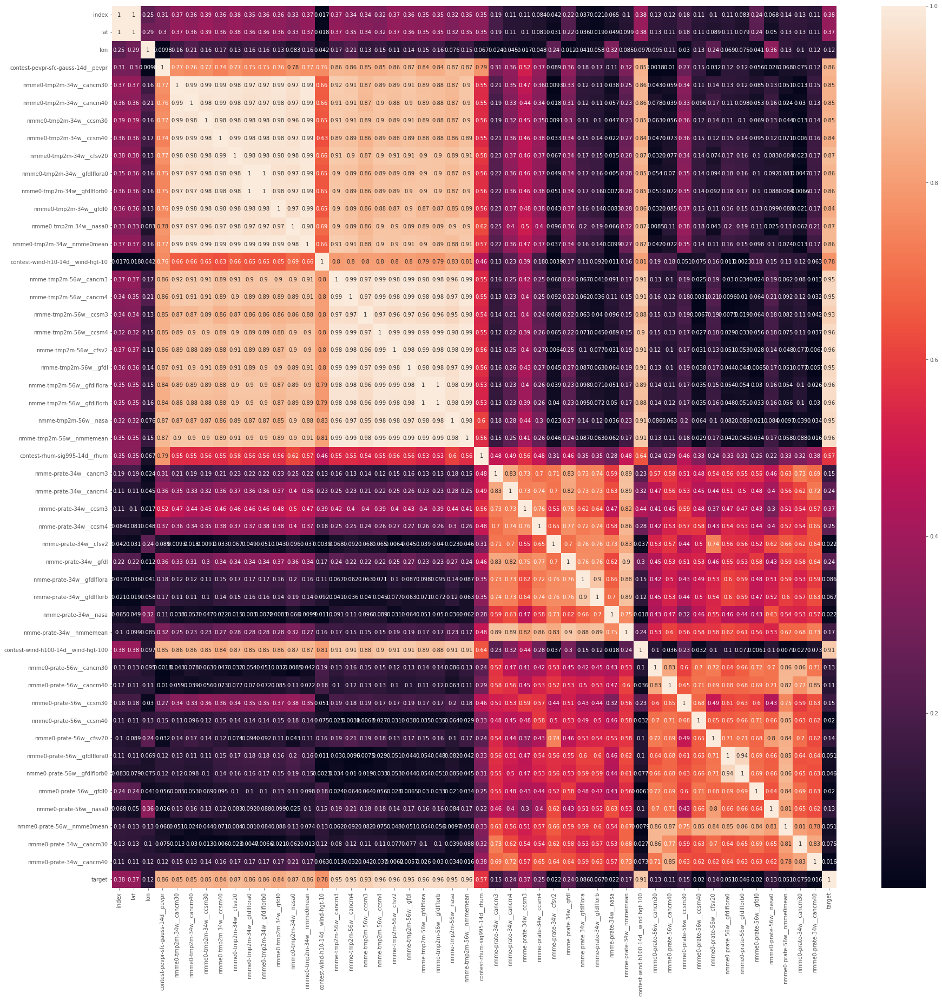

In [ ]:
plt.figure(figsize=(30,30))
sns.heatmap(trial.corr(method='spearman').abs(), annot = True)    

plt.show()

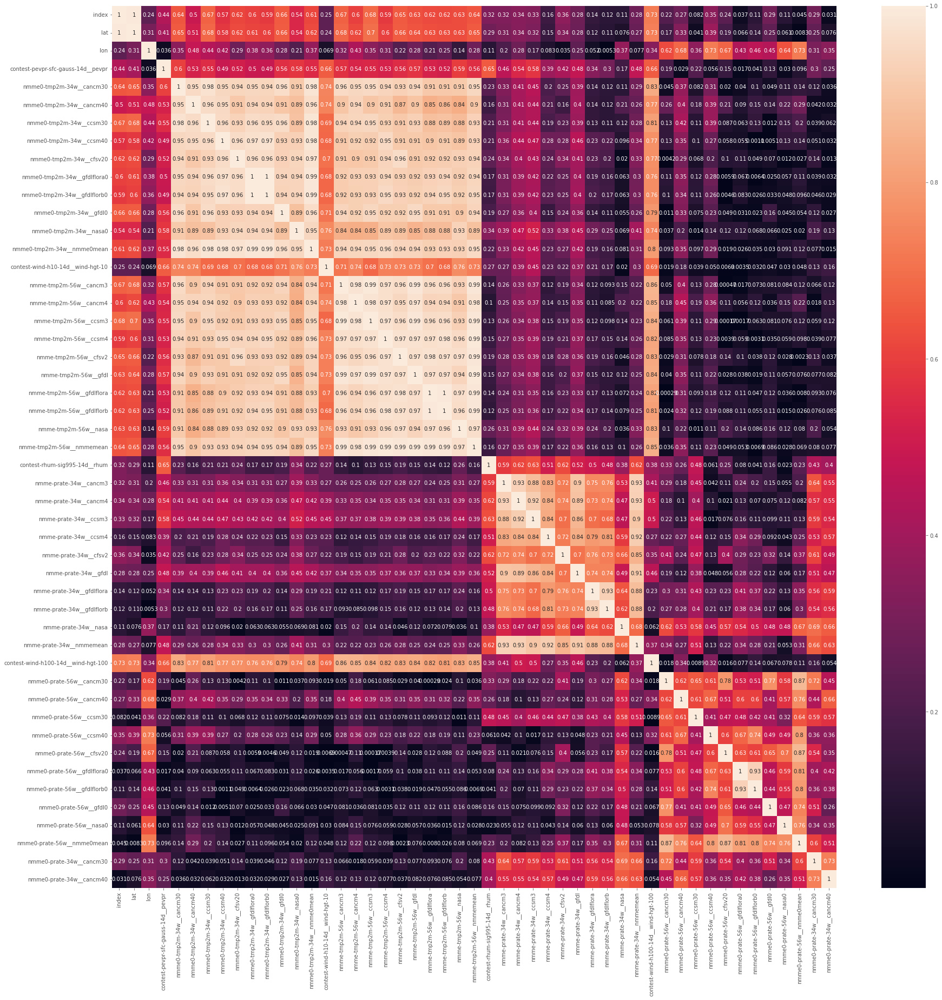

In [ ]:
trial_test = test_df.iloc[:, :50]
plt.figure(figsize=(30,30))
sns.heatmap(trial_test.corr().abs(), annot = True)    

plt.show()

**Correlation Check Next 50 Col**
- nmme-temp2m-34w: highly correlate with others and with target
- cancm30, cancm40, ccsm40, cfsv20, gfdlflora0, gfdlflorb0, gfdl0, nasa0, nmme0mean: highly correlate with other

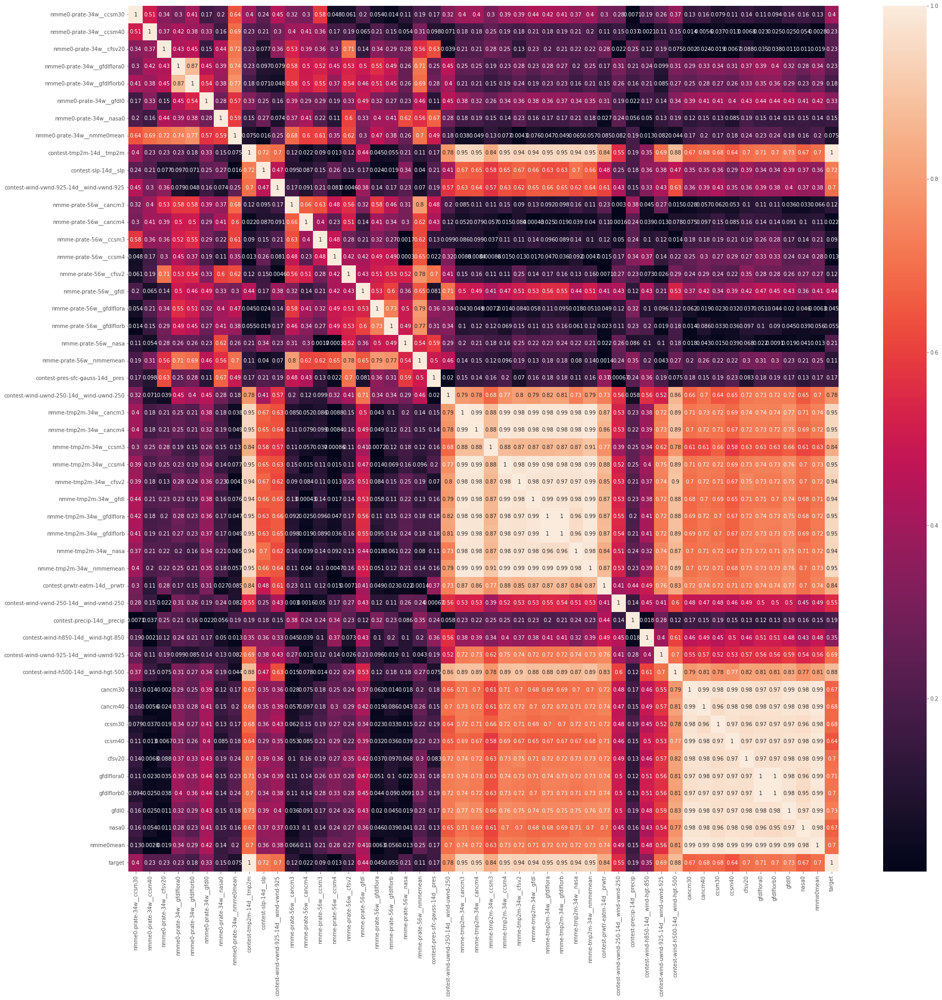

In [ ]:
trial2 = train_df.iloc[:10000, 50:100]
trial2.shape
target = 'contest-tmp2m-14d__tmp2m'
trial2['target'] = train_df[target][:10000]
plt.figure(figsize=(30,30))
sns.heatmap(trial2.corr().abs(), annot = True)    

plt.show()

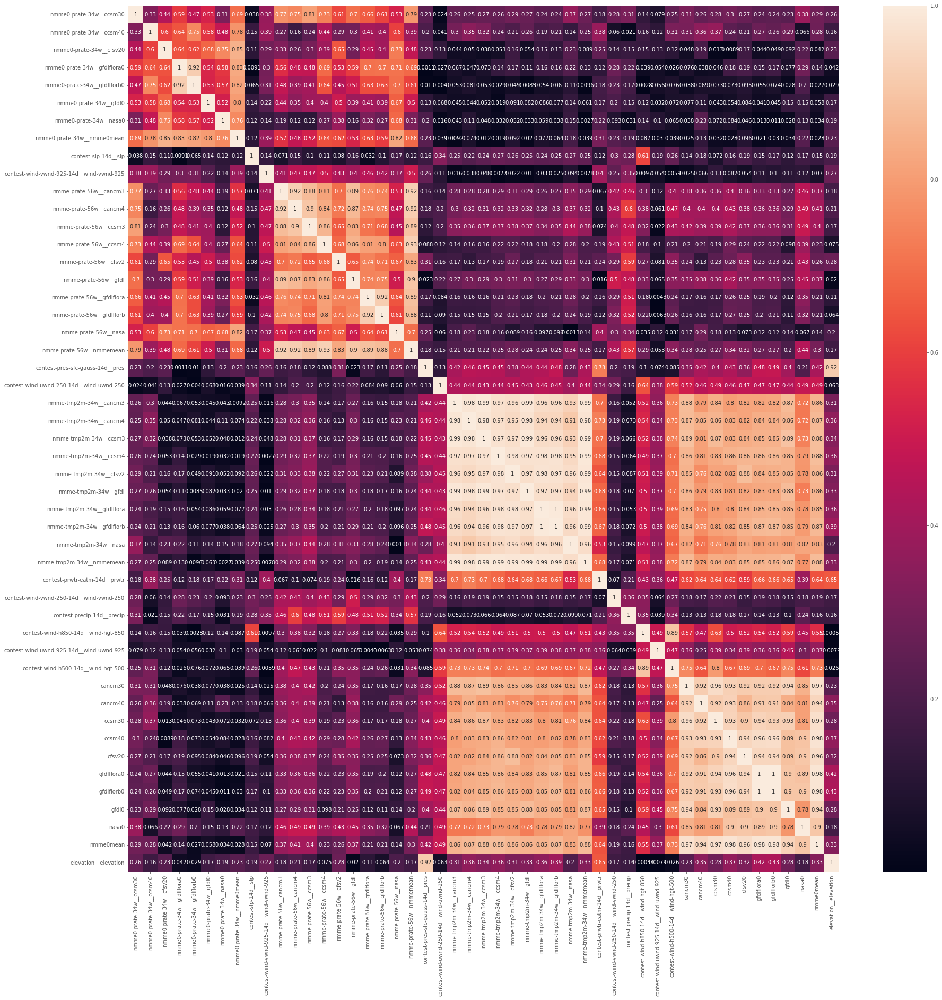

In [ ]:
trial_test2= test_df.iloc[:, 50:100]
plt.figure(figsize=(30,30))
sns.heatmap(trial_test2.corr().abs(), annot = True)    

plt.show()

**Correlation check next 100 col**
- wind-hgt-500-2010-1 and wind-uwnd-925-2010-1: highly correlated with target and also correlate with other.
- wind-hgt-850-2010-1, wind-vwnd-250-2010-1 and wind-uwnd-250-2010-1: highly correlated with target and also correlate with other.
- icec-2010-1 vs sst-2010-1: highly correlated with each other.

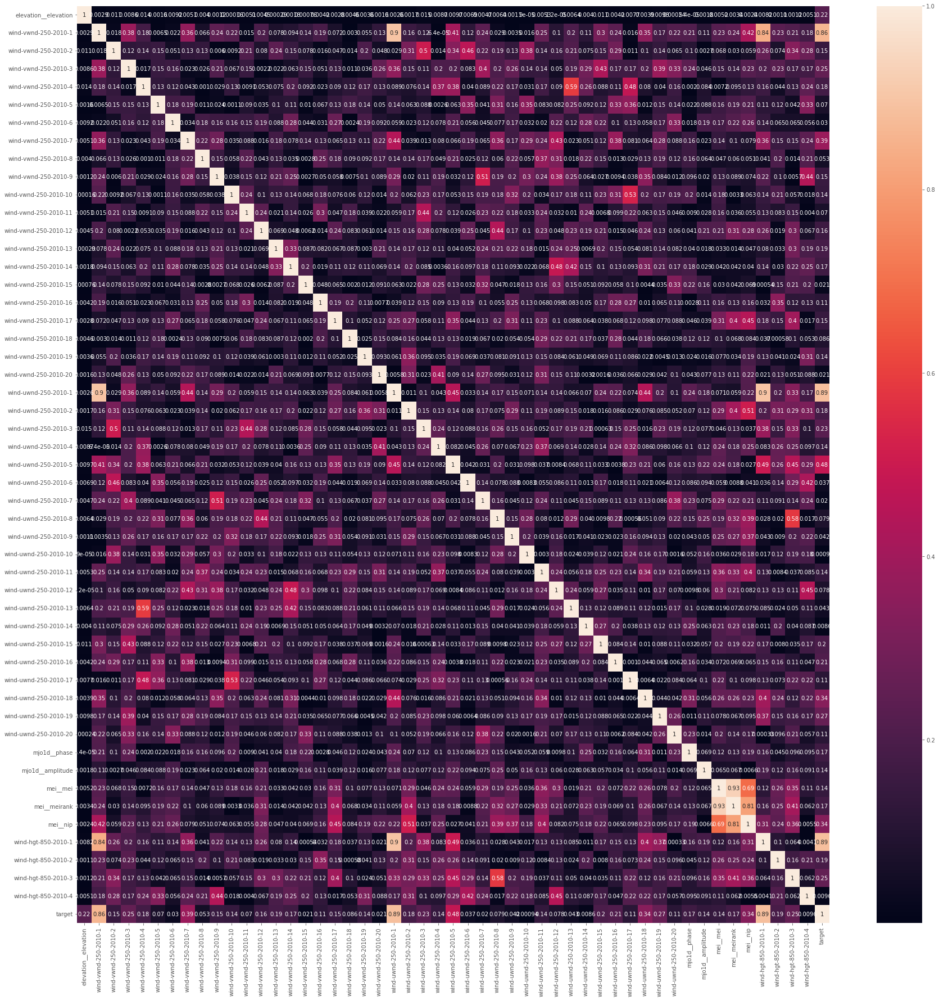

In [ ]:
trial3 = train_df.iloc[:10000, 100:150]
trial3.shape
target = 'contest-tmp2m-14d__tmp2m'
trial3['target'] = train_df[target][:10000]
plt.figure(figsize=(30,30))
sns.heatmap(trial3.corr().abs(), annot = True)    

plt.show()

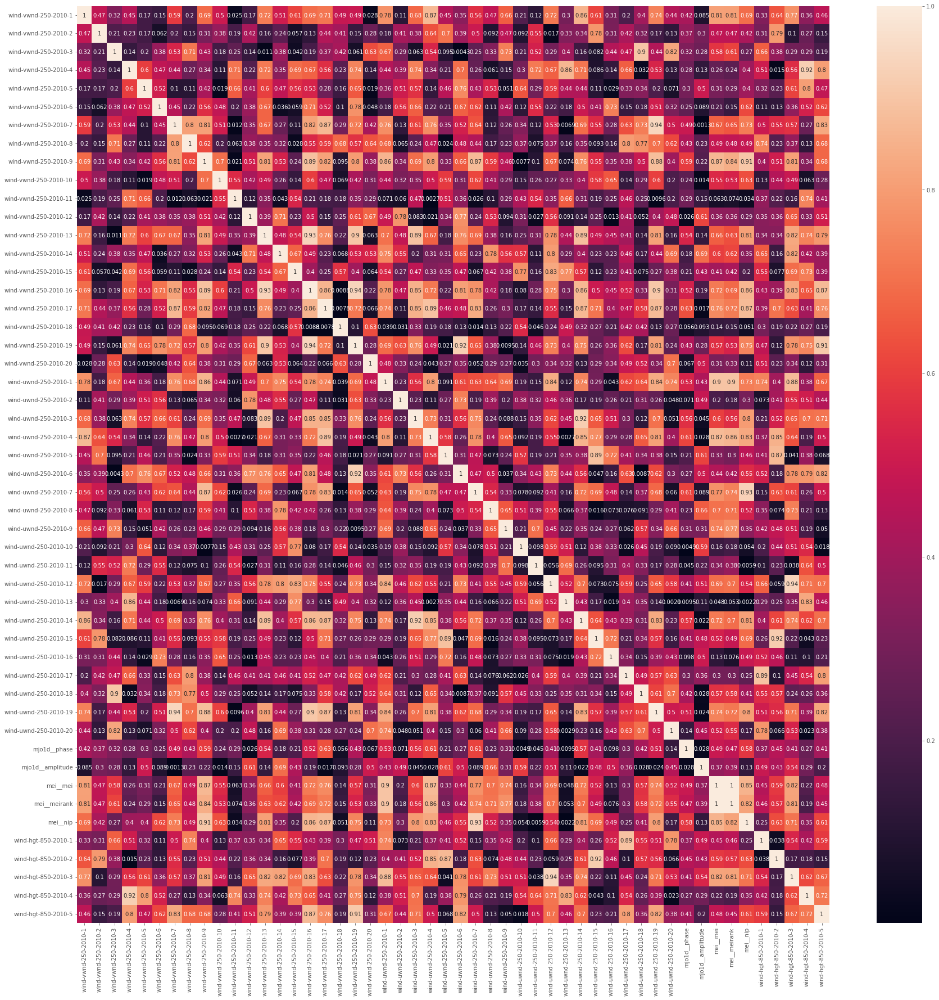

In [ ]:
trial_test3= test_df.iloc[:, 100:150]
plt.figure(figsize=(30,30))
sns.heatmap(trial_test3.corr().abs(), annot = True)    

plt.show()

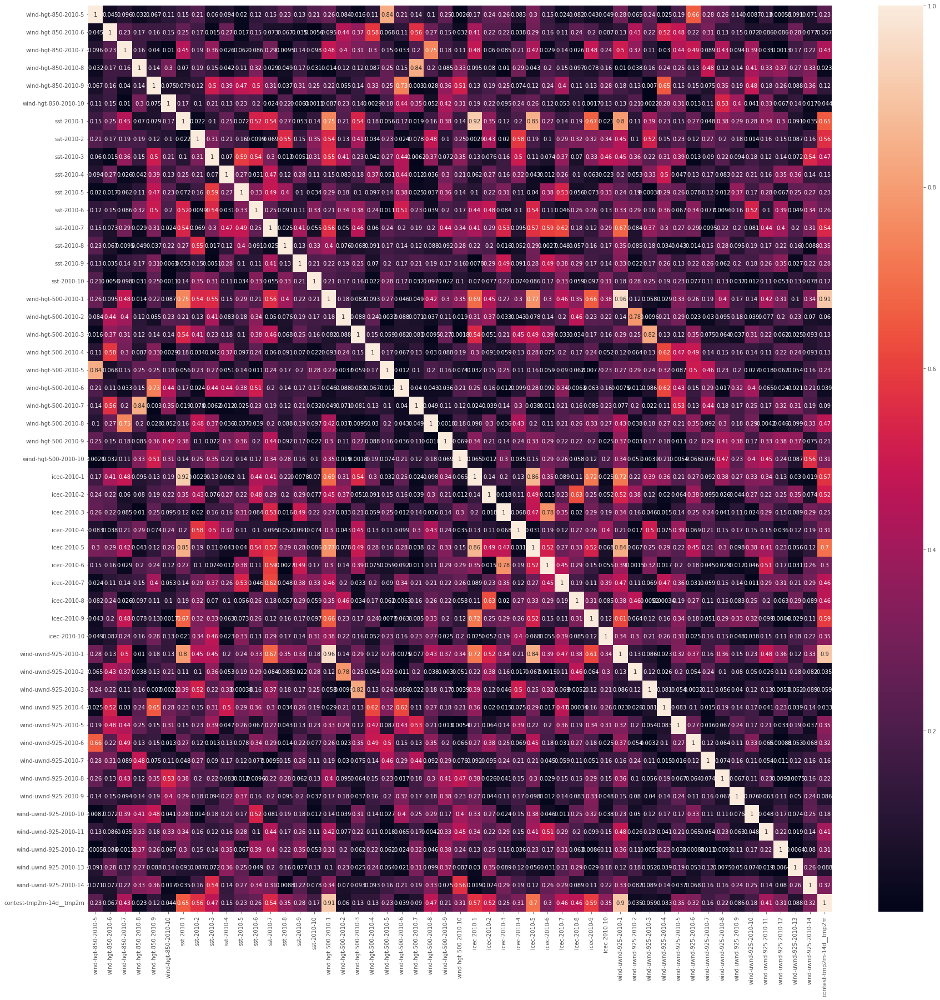

In [ ]:
trial4 = train_df.iloc[:10000, 150:200]
trial4.shape
trial4[target] = train_df[target][:10000]
plt.figure(figsize=(30,30))
sns.heatmap(trial4.corr().abs(), annot = True)    

plt.show()

**Correlation Check with remaining columns**
- wind-hgt-100-2010-1 and wind-hgt-10-2010-1 and wind-vwnd-925-2010-1 are highly correlated with each other and with target

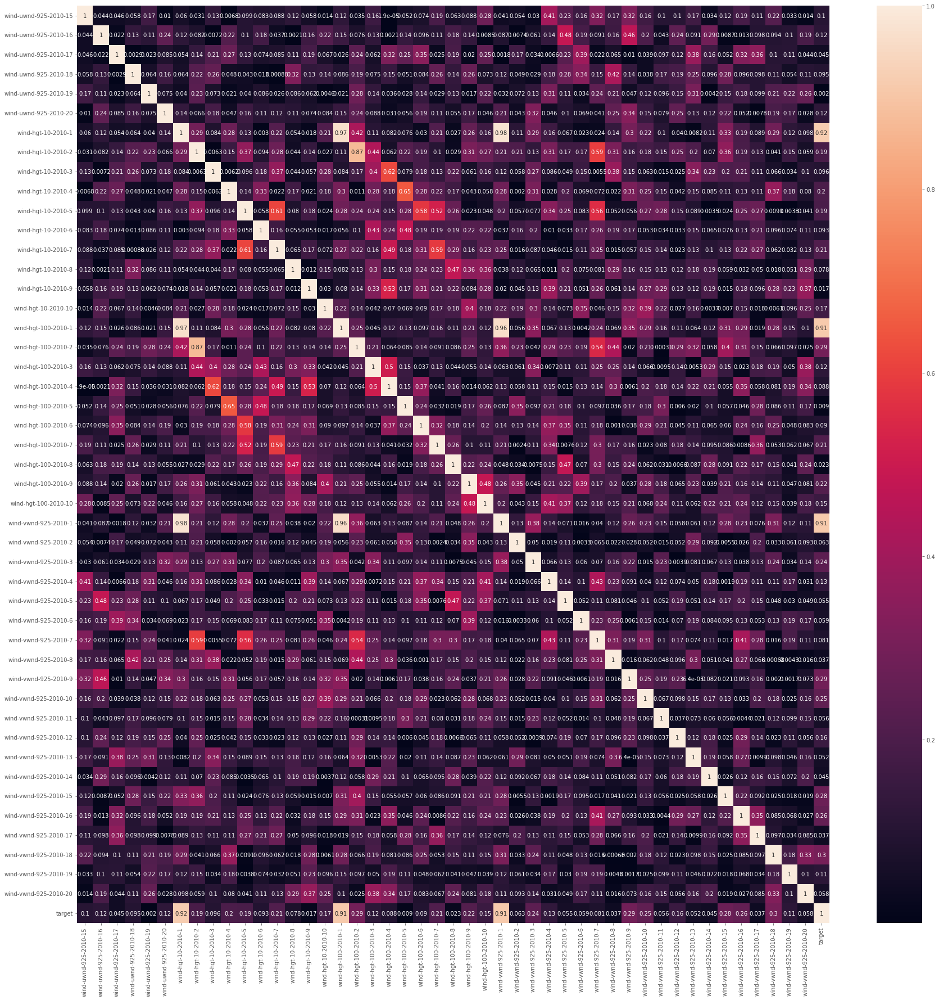

In [ ]:
trial5 = train_df.iloc[:10000, 200:]
trial5.shape
target = 'contest-tmp2m-14d__tmp2m'
trial5['target'] = train_df[target][:10000]
plt.figure(figsize=(30,30))
sns.heatmap(trial5.corr().abs(), annot = True)    

plt.show()

In [ ]:
inspect_df = pd.DataFrame(columns=['Column Name', 'Data Type', 'Example Value', '% Null'])
n = len(train_df)
for col in train_df.columns:
  temp = {'Column Name': col, 'Data Type': train_df[col].dtype, 
          'Example Value': train_df[col][0], '% Null': train_df[col].isna().sum()/n}
  inspect_df = inspect_df.append(temp, ignore_index=True)
inspect_df

,Column Name,Data Type,Example Value,% Null
0,index,int64,0,0.0
1,lat,float64,0.0,0.0
2,lon,float64,0.833333,0.0
3,startdate,object,9/1/14,0.0
4,contest-pevpr-sfc-gauss-14d__pevpr,float64,237.0,0.0
...,...,...,...,...
241,wind-vwnd-925-2010-16,float64,48.13,0.0
242,wind-vwnd-925-2010-17,float64,28.09,0.0
243,wind-vwnd-925-2010-18,float64,-13.5,0.0
244,wind-vwnd-925-2010-19,float64,11.9,0.0


In [ ]:
missing = inspect_df[inspect_df['% Null'] != 0]
missing

,Column Name,Data Type,Example Value,% Null
7,nmme0-tmp2m-34w__ccsm30,float64,29.57,0.042408
18,nmme-tmp2m-56w__ccsm3,float64,27.13,0.027360
29,nmme-prate-34w__ccsm3,float64,13.59,0.023256
40,nmme0-prate-56w__ccsm30,float64,14.37,0.042408
50,nmme0-prate-34w__ccsm30,float64,5.19,0.042408
63,nmme-prate-56w__ccsm3,float64,10.35,0.027360
75,nmme-tmp2m-34w__ccsm3,float64,27.57,0.023256
91,ccsm30,float64,28.85,0.042408


In [ ]:
# Cat col
cat_col = inspect_df[inspect_df['Data Type'] == 'object']
cat_col

,Column Name,Data Type,Example Value,% Null
3,startdate,object,9/1/14,0.0
99,climateregions__climateregion,object,BSh,0.0


In [ ]:
def extract_datetime(df):
    df['startdate'] = pd.to_datetime(df['startdate'])
    df['year'] = df['startdate'].dt.year
    df['month'] = df['startdate'].dt.month
    df['day_of_year'] = df['startdate'].dt.dayofyear
    return df

train_df = extract_datetime(train_df)
test_df = extract_datetime(test_df)

In [ ]:
train_df.month.value_counts()

10    31868
12    31868
1     31868
3     31868
5     31868
7     31868
8     31868
9     30840
11    30840
4     30840
6     30840
2     29298
Name: month, dtype: int64

In [ ]:
test_df.month.value_counts() # imbalance data between train and test data

12    15934
11    15420
Name: month, dtype: int64

In [ ]:
train_df.year.value_counts()

2015    187610
2016    125416
2014     62708
Name: year, dtype: int64

In [ ]:
test_df.year.value_counts()

2022    31354
Name: year, dtype: int64

In [ ]:
# Check time intervals
train_df['delta'] = train_df['startdate'] - train_df['startdate'].shift(1)
train_df[['startdate', 'delta']].head()

,startdate,delta
0,2014-09-01,NaT
1,2014-09-02,1 days
2,2014-09-03,1 days
3,2014-09-04,1 days
4,2014-09-05,1 days


In [ ]:
# Check time intervals
test_df['startdate'] = pd.to_datetime(test_df['startdate'])
test_df['delta'] = test_df['startdate'] - test_df['startdate'].shift(1)
test_df[['startdate', 'delta']].loc[:50, :]

,startdate,delta
0,2022-11-01,NaT
1,2022-11-02,1 days
2,2022-11-03,1 days
3,2022-11-04,1 days
4,2022-11-05,1 days
5,2022-11-06,1 days
6,2022-11-07,1 days
7,2022-11-08,1 days
8,2022-11-09,1 days
9,2022-11-10,1 days


# Exploratory Data Analysis

<AxesSubplot:xlabel='contest-tmp2m-14d__tmp2m'>

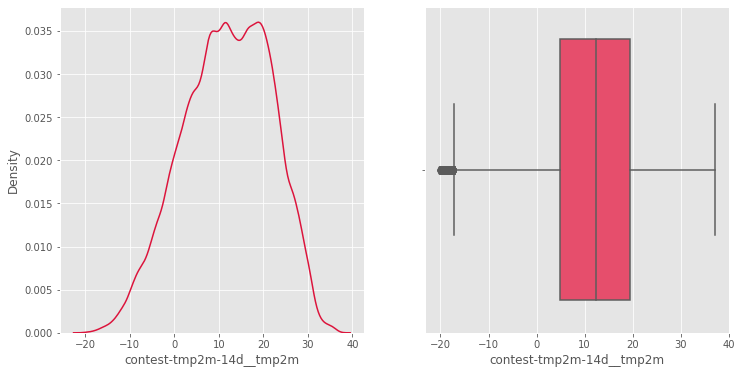

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))
plt.subplot(121)
sns.kdeplot(train_df['contest-tmp2m-14d__tmp2m'], color = "crimson", label='Train')
plt.subplot(122)
sns.boxplot(train_df['contest-tmp2m-14d__tmp2m'] , color = "#ff355d")

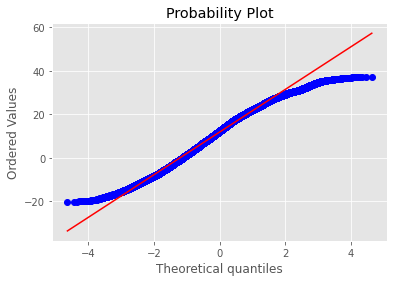

In [ ]:
res = stats.probplot(train_df['contest-tmp2m-14d__tmp2m'], plot=plt)

In [ ]:
def kdeplot_features(df_train,df_test, feature, title):
    '''Takes a column from the dataframe and plots the distribution (after count).'''
    
    values_train = df_train[feature].to_numpy()
    values_test = df_test[feature].to_numpy()  
     
    plt.figure(figsize = (18, 3))
    
    sns.kdeplot(values_train, color = 'crimson', label='train')
    sns.kdeplot(values_test, color = 'limegreen', label='test')
    
    plt.title(title, fontsize=15)
    plt.legend()
    plt.show();
    
    del values_train , values_test
    gc.collect()

    
def countplot_features(df_train, df_test, feature, title):
    '''Takes a column from the dataframe and plots the distribution (after count).'''
         
    plt.figure(figsize = (10, 5))
    
    sns.countplot(df_train[feature], color = 'crimson')
    sns.countplot(df_test[feature], color = 'limegreen')
    plt.legend(labels=["Train","Test"])
        
    plt.title(title, fontsize=15)    
    plt.show();

In [ ]:
numerical_features = ['nmme0-tmp2m-34w__nasa0', 'nmme-tmp2m-56w__cancm3', 'nmme-tmp2m-56w__gfdlflorb','nmme-prate-34w__cancm4','nmme-prate-34w__gfdlflora']

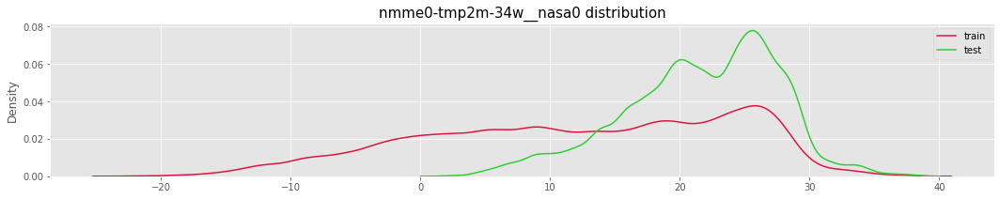

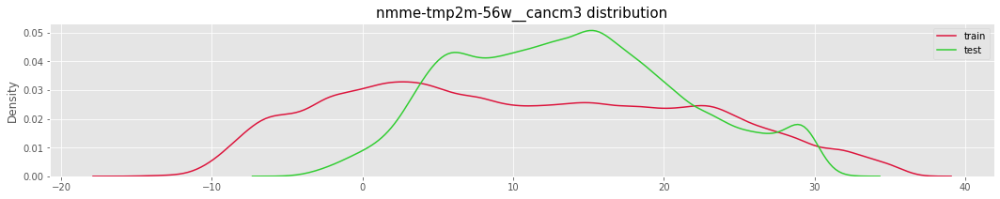

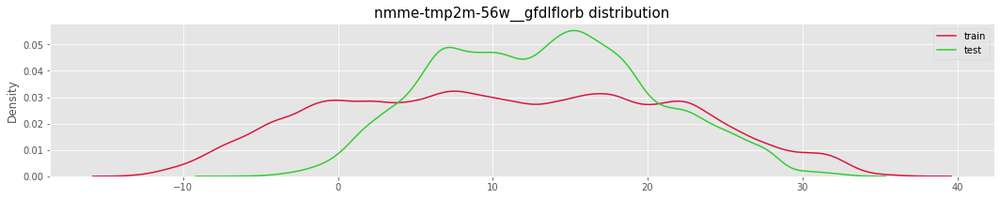

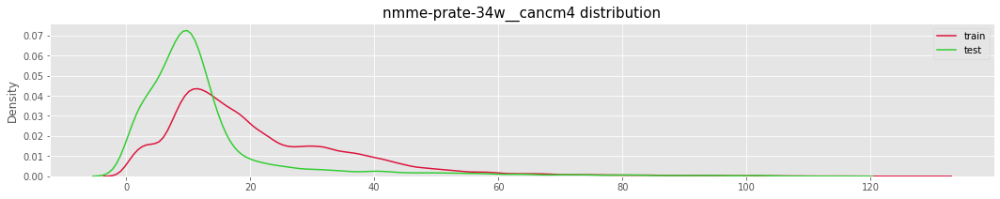

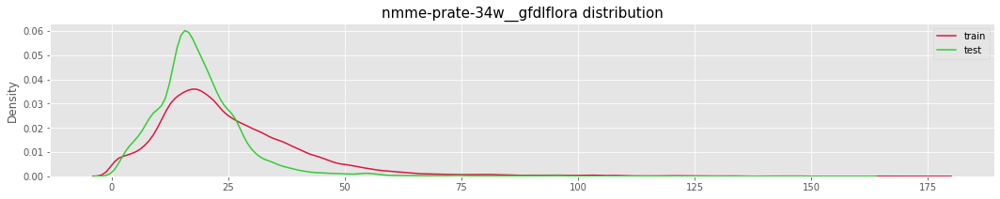

In [ ]:
# plot distributions of features
for feature in numerical_features:
    kdeplot_features(train_df,test_df, feature=feature, title = feature + " distribution")

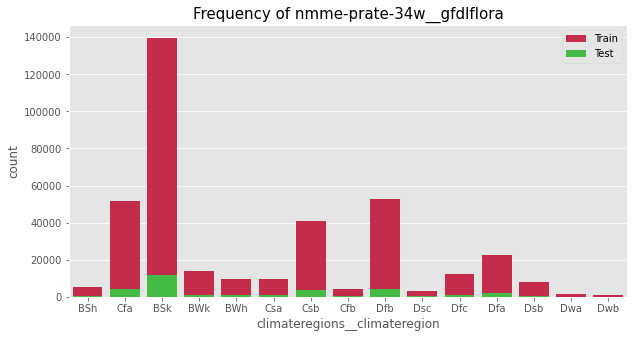

In [ ]:
countplot_features(train_df, test_df, feature='climateregions__climateregion', title = "Frequency of "+ feature)

**Comment**
- Taking some numeric variables as representation we observe that difference in distribution of these var between train and test set is not remarkable because test contains only 2 months.
- Not much difference in the distribution of climate region 

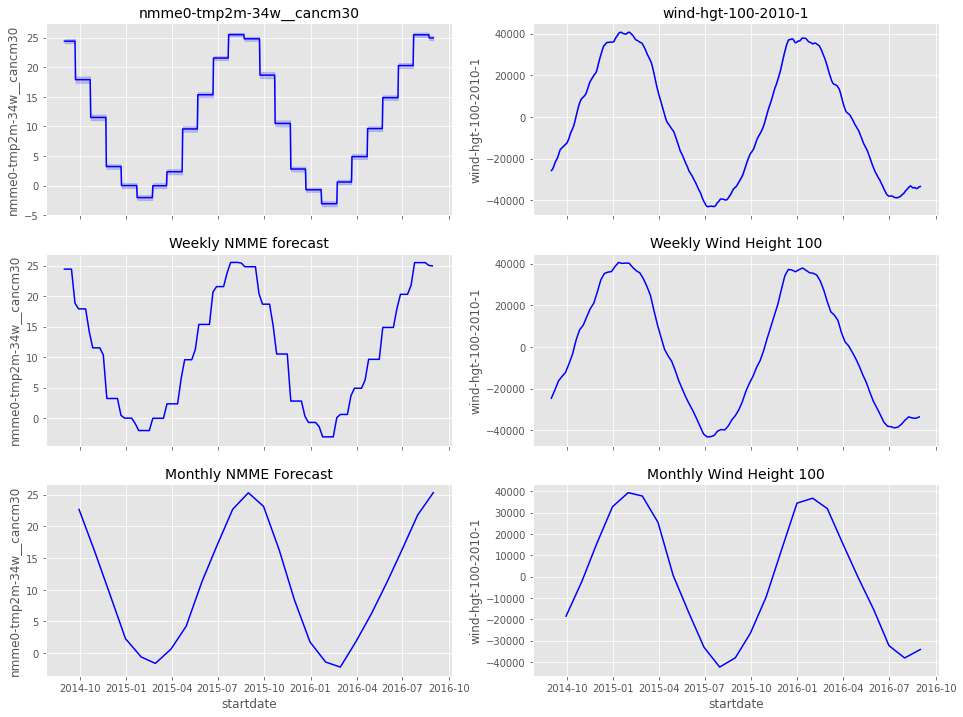

In [ ]:

# Smoothing data by downsampling
fig, ax = plt.subplots(ncols=2, nrows=3, sharex=True, figsize=(16,12))

sns.lineplot(train_df['startdate'], train_df['nmme0-tmp2m-34w__cancm30'], color='blue', ax=ax[0, 0])
ax[0, 0].set_title('nmme0-tmp2m-34w__cancm30', fontsize=14)

resampled_df = train_df[['startdate','nmme0-tmp2m-34w__cancm30']].resample('7D', on='startdate').mean().reset_index(drop=False)
sns.lineplot(resampled_df['startdate'], resampled_df['nmme0-tmp2m-34w__cancm30'], color='blue', ax=ax[1, 0])
ax[1, 0].set_title('Weekly NMME forecast', fontsize=14)

resampled_df = train_df[['startdate','nmme0-tmp2m-34w__cancm30']].resample('M', on='startdate').mean().reset_index(drop=False)
sns.lineplot(resampled_df['startdate'], resampled_df['nmme0-tmp2m-34w__cancm30'], color='blue', ax=ax[2, 0])
ax[2, 0].set_title('Monthly NMME Forecast', fontsize=14)

sns.lineplot(train_df['startdate'], train_df['wind-hgt-100-2010-1'], color='blue', ax=ax[0, 1])
ax[0, 1].set_title('wind-hgt-100-2010-1', fontsize=14)

resampled_df = train_df[['startdate','wind-hgt-100-2010-1']].resample('7D', on='startdate').mean().reset_index(drop=False)
sns.lineplot(resampled_df['startdate'], resampled_df['wind-hgt-100-2010-1'], color='blue', ax=ax[1, 1])
ax[1, 1].set_title('Weekly Wind Height 100', fontsize=14)

resampled_df = train_df[['startdate','wind-hgt-100-2010-1']].resample('M', on='startdate').mean().reset_index(drop=False)
sns.lineplot(resampled_df['startdate'], resampled_df['wind-hgt-100-2010-1'], color='blue', ax=ax[2, 1])
ax[2, 1].set_title('Monthly Wind Height 100', fontsize=14)

plt.show()

**Comment**
- Original data is quite smooth so it is optional (not necessary) to conduct downsampling

**Test for Stationary**
- Stationary won't affect much performance of tree-based, boosting or DL model.
- However if we want to use models like ARIMA, we should test for it and transform data.

See explanation in ref link here: https://www.kaggle.com/code/andreshg/timeseries-analysis-a-complete-guide

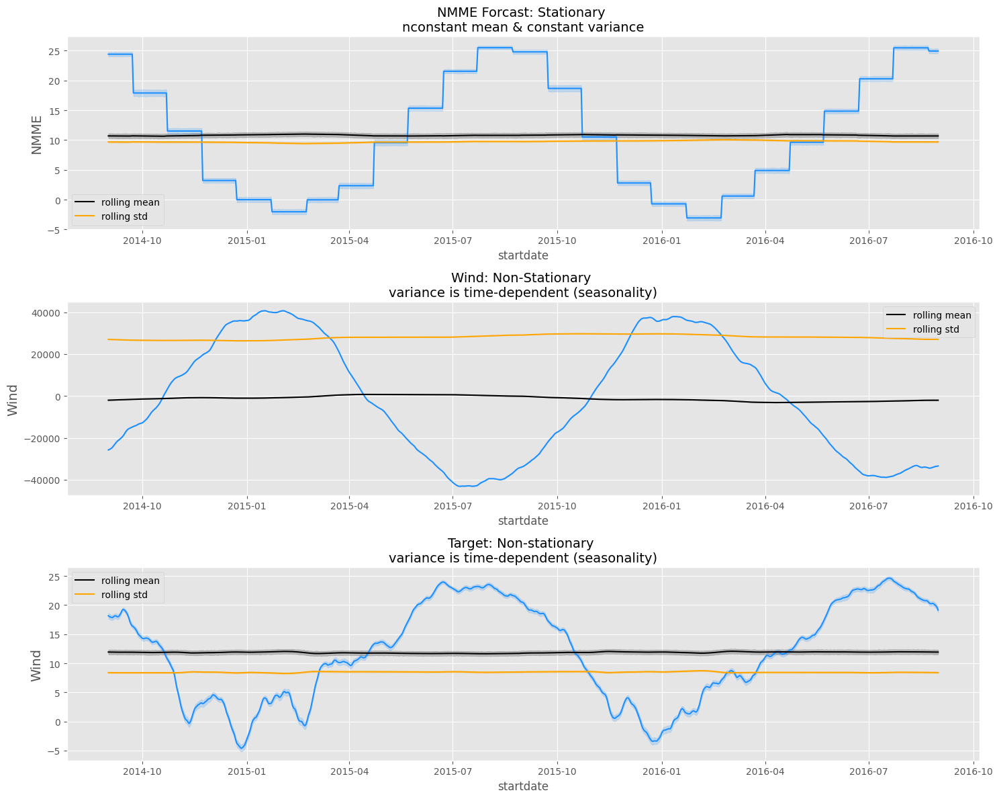

In [ ]:
# A year has 52 weeks (52 weeks * 7 days per week) aporx.
# Rolling is actually the concept of moving average
rolling_window = 52*7
f, ax = plt.subplots(nrows=3, ncols=1, figsize=(15, 12))

sns.lineplot(x=train_df['startdate'], y=train_df['nmme0-tmp2m-34w__cancm30'], ax=ax[0], color='dodgerblue')
sns.lineplot(x=train_df['startdate'], y=train_df['nmme0-tmp2m-34w__cancm30'].rolling(rolling_window).mean(), ax=ax[0], color='black', label='rolling mean')
sns.lineplot(x=train_df['startdate'], y=train_df['nmme0-tmp2m-34w__cancm30'].rolling(rolling_window).std(), ax=ax[0], color='orange', label='rolling std')
ax[0].set_title('NMME Forcast: Stationary \nnconstant mean & constant variance', fontsize=14)
ax[0].set_ylabel(ylabel='NMME', fontsize=14)

sns.lineplot(x=train_df['startdate'], y=train_df['wind-hgt-100-2010-1'], ax=ax[1], color='dodgerblue')
sns.lineplot(x=train_df['startdate'], y=train_df['wind-hgt-100-2010-1'].rolling(rolling_window).mean(), ax=ax[1], color='black', label='rolling mean')
sns.lineplot(x=train_df['startdate'], y=train_df['wind-hgt-100-2010-1'].rolling(rolling_window).std(), ax=ax[1], color='orange', label='rolling std')
ax[1].set_title('Wind: Non-Stationary \nvariance is time-dependent (seasonality)', fontsize=14)
ax[1].set_ylabel(ylabel='Wind', fontsize=14)

sns.lineplot(x=train_df['startdate'], y=train_df['contest-tmp2m-14d__tmp2m'], ax=ax[2], color='dodgerblue')
sns.lineplot(x=train_df['startdate'], y=train_df['contest-tmp2m-14d__tmp2m'].rolling(rolling_window).mean(), ax=ax[2], color='black', label='rolling mean')
sns.lineplot(x=train_df['startdate'], y=train_df['contest-tmp2m-14d__tmp2m'].rolling(rolling_window).std(), ax=ax[2], color='orange', label='rolling std')
ax[2].set_title('Target: Non-stationary \nvariance is time-dependent (seasonality)', fontsize=14)
ax[2].set_ylabel(ylabel='Wind', fontsize=14)

plt.tight_layout()
plt.show()

**Comment**
- Non-stationary because of non constant mean and standard deviation.
- We can see there is a cosine seasonality here. Data follows quite strictly the trend of rolling window features => useful to detect trend.

**Augmented Dickey-Fuller (ADF)** test is a type of statistical test called a unit root test. Unit roots are a cause for non-stationarity.

- Null Hypothesis (H0): Time series has a unit root. (Time series is not stationary).

- Alternate Hypothesis (H1): Time series has no unit root (Time series is stationary).

If the null hypothesis can be rejected, we can conclude that the time series is stationary.

In [ ]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(train_df['cancm30'].values)
result
# run too long :| => quit

In [ ]:
# Code only for Reference, don't run
f, ax = plt.subplots(nrows=3, ncols=2, figsize=(15, 9))
selected_col = ['nmme0-tmp2m-34w__cancm30', 'nmme-tmp2m-56w__cancm3', 'contest-wind-h100-14d__wind-hgt-100',
                'wind-hgt-100-2010-1', 'sst-2010-1', 'cancm30']
def visualize_adfuller_results(series, title, ax):
    result = adfuller(series)
    significance_level = 0.05
    adf_stat = result[0]
    p_val = result[1]
    crit_val_1 = result[4]['1%']
    crit_val_5 = result[4]['5%']
    crit_val_10 = result[4]['10%']

    if (p_val < significance_level) & ((adf_stat < crit_val_1)):
        linecolor = 'forestgreen' 
    elif (p_val < significance_level) & (adf_stat < crit_val_5):
        linecolor = 'orange'
    elif (p_val < significance_level) & (adf_stat < crit_val_10):
        linecolor = 'red'
    else:
        linecolor = 'purple'
    sns.lineplot(x=train_df['startdate'], y=series, ax=ax, color=linecolor)
    ax.set_title(f'ADF Statistic {adf_stat:0.3f}, p-value: {p_val:0.3f}\nCritical Values 1%: {crit_val_1:0.3f}, 5%: {crit_val_5:0.3f}, 10%: {crit_val_10:0.3f}', fontsize=14)
    ax.set_ylabel(ylabel=title, fontsize=14)

visualize_adfuller_results(train_df['nmme0-tmp2m-34w__cancm30'].values, 'NMME Forecast', ax[0, 0])
visualize_adfuller_results(train_df['contest-wind-h100-14d__wind-hgt-100'].values, 'Wind 14d', ax[1, 0])
visualize_adfuller_results(train_df['wind-hgt-100-2010-1'].values, 'Wind at 100m 2010', ax[0, 1])
visualize_adfuller_results(train_df['sst-2010-1'].values, 'Sea Surface Temp', ax[1, 1])
visualize_adfuller_results(train_df['cancm30'].values, 'CanCm30 Forecast', ax[2, 0])

f.delaxes(ax[2, 1])
plt.tight_layout()
plt.show()

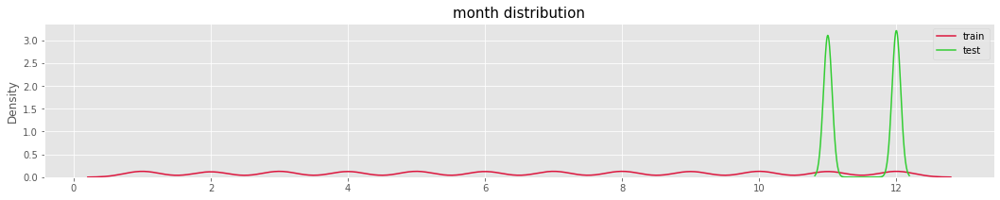

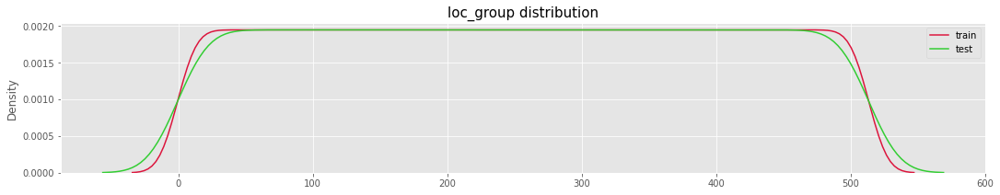

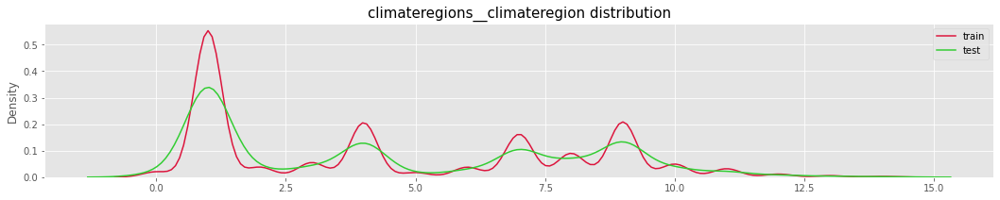

In [ ]:
feature = ['month', 'loc_group', 'climateregions__climateregion']
for f in feature:
  kdeplot_features(train_df,test_df, feature=f, title = f + " distribution")

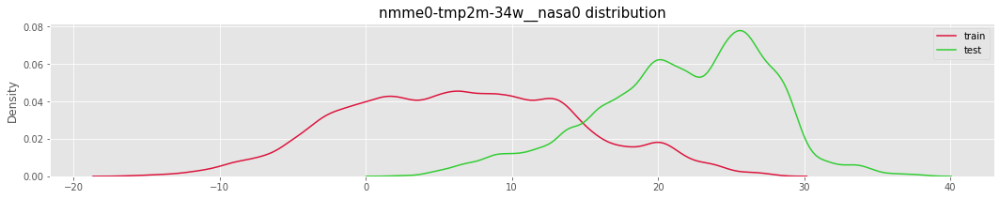

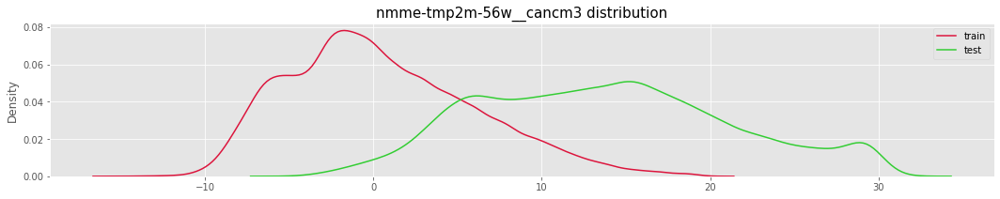

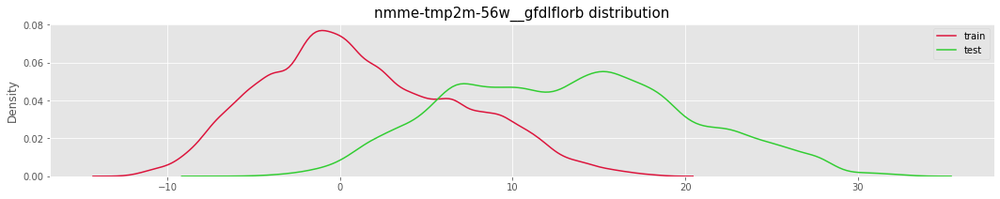

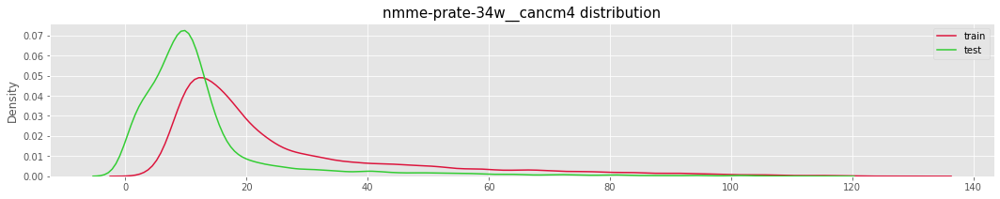

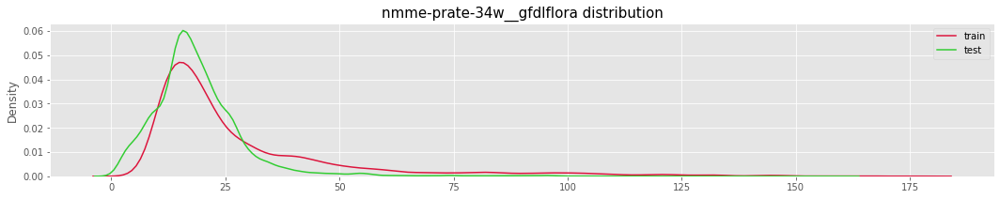

In [ ]:
df1 = train_df[(train_df['month'] == 11) | (train_df['month'] == 12)]
numerical_features = ['nmme0-tmp2m-34w__nasa0', 'nmme-tmp2m-56w__cancm3', 'nmme-tmp2m-56w__gfdlflorb','nmme-prate-34w__cancm4','nmme-prate-34w__gfdlflora']
for f in numerical_features:
  kdeplot_features(df1, test_df, feature=f, title = f + " distribution")

**Comment:**
- Data in test sets is in November and December. Visualize distributions of Nov and Dec numeric data in train and test set, we observe that there is a distrbution shift, i.e they don't have the same distribution. => we should not drop all data from other months in train set.

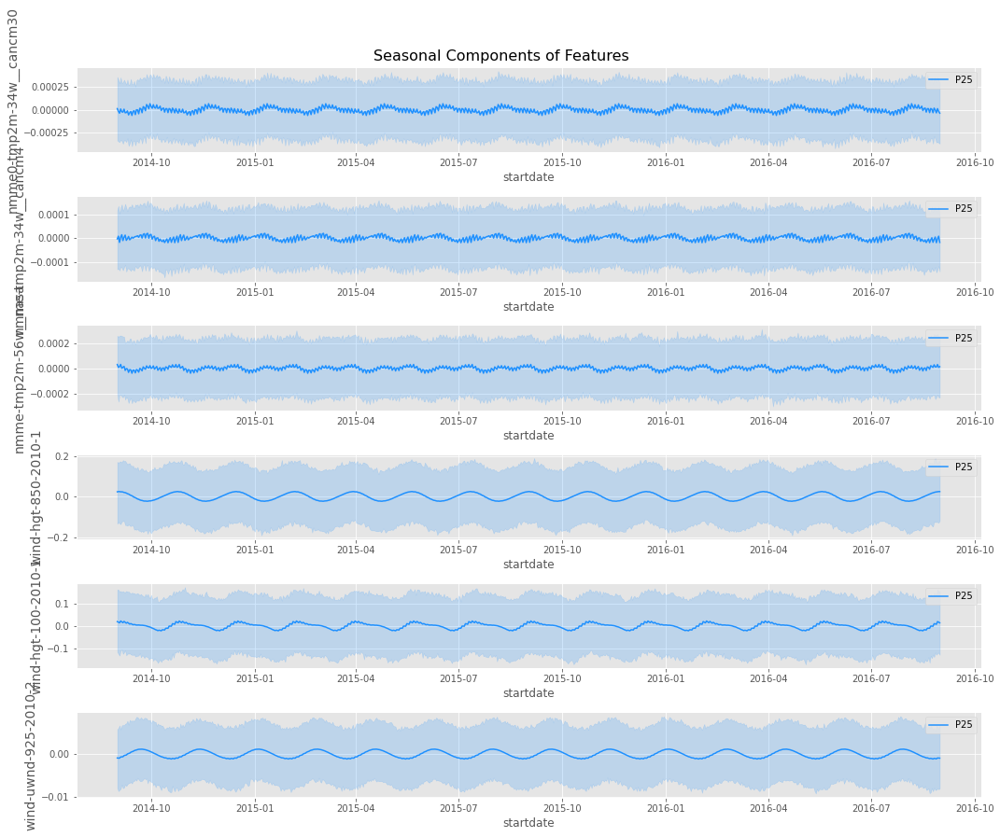

In [ ]:
f, ax = plt.subplots(nrows=6, ncols=1, figsize=(15, 12))
f.suptitle('Seasonal Components of Features', fontsize=16)

core_columns = ['nmme0-tmp2m-34w__cancm30', 'nmme-tmp2m-34w__cancm4', 'nmme-tmp2m-56w__nasa',
                'wind-hgt-850-2010-1', 'wind-hgt-100-2010-1', 'wind-uwnd-925-2010-2']
for i, column in enumerate(core_columns):
    decomp = seasonal_decompose(train_df[column], period=52, model='additive', extrapolate_trend='freq')
    train_df[f"{column}_seasonal"] = decomp.seasonal
    sns.lineplot(x=train_df['startdate'], y=train_df[column + '_seasonal'], ax=ax[i], color='dodgerblue', label='P25')
    ax[i].set_ylabel(ylabel=column, fontsize=14)
    
plt.tight_layout()
plt.show()

**Comment**
- This suggests that most numeric features follow sine/cosine trend.

**Test for correlation of lag series**

In [ ]:
def add_lag(df, feat_name):
    days_in_week = 7
    core_columns = feat_name

    for column in core_columns:
        df[f'{column}_shift_b_1m'] = df[column].shift(-4 * days_in_week)
        df[f'{column}_shift_b_3w'] = df[column].shift(-3 * days_in_week)
        df[f'{column}_shift_b_2w'] = df[column].shift(-2 * days_in_week)
        df[f'{column}_shift_b_1w'] = df[column].shift(-1 * days_in_week)

        df[f'{column}_shift_1w'] = df[column].shift(1 * days_in_week)
        df[f'{column}_shift_2w'] = df[column].shift(2 * days_in_week)
        df[f'{column}_shift_3w'] = df[column].shift(3 * days_in_week)
        df[f'{column}_shift_1m'] = df[column].shift(4 * days_in_week)

        df[f'{column}_shift_b_1y'] = df[column].shift(-52 * days_in_week)
        df[f'{column}_shift_1y'] = df[column].shift(52 * days_in_week)

column = ['nmme0-tmp2m-34w__cancm30', 'wind-hgt-850-2010-1']
target = 'contest-tmp2m-14d__tmp2m'
df = train_df.copy()
add_lag(df, column)
for c in df.columns:
  if 'shift' in c:
    print(c + ':\t\t' + str(df[target].corr(df[c], method='kendall')))

nmme0-tmp2m-34w__cancm30_shift_b_1m:		0.7904342625702997
nmme0-tmp2m-34w__cancm30_shift_b_3w:		0.7726380948689338
nmme0-tmp2m-34w__cancm30_shift_b_2w:		0.739524889389622
nmme0-tmp2m-34w__cancm30_shift_b_1w:		0.6982511486578307
nmme0-tmp2m-34w__cancm30_shift_1w:		0.5907932147975331
nmme0-tmp2m-34w__cancm30_shift_2w:		0.5342032846586069
nmme0-tmp2m-34w__cancm30_shift_3w:		0.479549753238259
nmme0-tmp2m-34w__cancm30_shift_1m:		0.4220550300432447
nmme0-tmp2m-34w__cancm30_shift_b_1y:		0.6324957307276134
nmme0-tmp2m-34w__cancm30_shift_1y:		0.655827489178667
wind-hgt-850-2010-1_shift_b_1m:		-0.46301534306719416
wind-hgt-850-2010-1_shift_b_3w:		-0.4987741426566625
wind-hgt-850-2010-1_shift_b_2w:		-0.5313393033767597
wind-hgt-850-2010-1_shift_b_1w:		-0.556876883598867
wind-hgt-850-2010-1_shift_1w:		-0.5820511656937392
wind-hgt-850-2010-1_shift_2w:		-0.5692012649369825
wind-hgt-850-2010-1_shift_3w:		-0.5411618443857469
wind-hgt-850-2010-1_shift_1m:		-0.5102741990148887
wind-hgt-850-2010-1_shift_b

**Test for correlation of rolling**

In [ ]:
def add_rolling(df, feat_name):
    days_in_week = 7
    core_columns = feat_name

    for column in core_columns:
        df[f'{column}_rolling_1w'] = df[column].rolling(1 * days_in_week).mean()
        df[f'{column}_rolling_2w'] = df[column].rolling(2 * days_in_week).mean()
        df[f'{column}_rolling_1m'] = df[column].rolling(4 * days_in_week).mean()
        df[f'{column}_rolling_2m'] = df[column].rolling(8 * days_in_week).mean()
        df[f'{column}_rolling_3m'] = df[column].rolling(12 * days_in_week).mean()
        df[f'{column}_rolling_6m'] = df[column].rolling(24 * days_in_week).mean()
        df[f'{column}_rolling_1y'] = df[column].rolling(52 * days_in_week).mean()

column = ['nmme0-tmp2m-34w__cancm30', 'wind-hgt-850-2010-1']
target = 'contest-tmp2m-14d__tmp2m'
df = train_df.copy()
add_rolling(df, column)
for c in df.columns:
  if 'rolling' in c:
    print(c + ':\t\t' + str(df[target].corr(df[c], method='kendall')))

nmme0-tmp2m-34w__cancm30_rolling_1w:		0.6269954218914034
nmme0-tmp2m-34w__cancm30_rolling_2w:		0.6009340971159447
nmme0-tmp2m-34w__cancm30_rolling_1m:		0.5477079630192377
nmme0-tmp2m-34w__cancm30_rolling_2m:		0.4319887830882728
nmme0-tmp2m-34w__cancm30_rolling_3m:		0.3155634837346239
nmme0-tmp2m-34w__cancm30_rolling_6m:		0.007328045478229767
nmme0-tmp2m-34w__cancm30_rolling_1y:		0.27713317002656956
wind-hgt-850-2010-1_rolling_1w:		-0.5832548166256794
wind-hgt-850-2010-1_rolling_2w:		-0.5907504292876111
wind-hgt-850-2010-1_rolling_1m:		-0.5865687452043257
wind-hgt-850-2010-1_rolling_2m:		-0.5376371780070786
wind-hgt-850-2010-1_rolling_3m:		-0.44734740736509215
wind-hgt-850-2010-1_rolling_6m:		-0.10613525069136795
wind-hgt-850-2010-1_rolling_1y:		0.017844193221162364


# Preprocessing
- Feature engineering on date time field
- Encoding categorical feature
- Missing value imputation: linear interpolation and ffill
- Train Test Split
- Drop uncorrelated columns
- Handle highly correlated group

In [ ]:
from pandas.core.internals.blocks import F
def rmse(actual, predicted):
    return mean_squared_error(actual, predicted, squared=False)

def location_nom(train, test):
    scale = 14

    train.loc[:,'lat']=round(train.lat,scale)
    train.loc[:,'lon']=round(train.lon,scale)
    test.loc[:,'lat']=round(test.lat,scale)
    test.loc[:,'lon']=round(test.lon,scale)

    all_df = pd.concat([train, test], axis=0)
    all_df['loc_group'] = all_df.groupby(['lat','lon']).ngroup()
    train = all_df.iloc[:len(train)]
    target = 'contest-tmp2m-14d__tmp2m'
    test = all_df.iloc[len(train):].drop(target, axis=1)
    
    return train, test

def drop_col(train, test, thresh):
    # drop low correlation columns:
    drop_list = []
    target = 'contest-tmp2m-14d__tmp2m'
    for col in test.columns[:]:
      if train[col].dtype.kind in 'biufc':  # check if col is numeric
        corr = train[target].corr(train[col], method='kendall')
        if abs(corr) <= thresh: # change drop threshold here: 0.03 ~ 30 col
          drop_list.append(col)
        else:
          continue
    
    train = train.drop(drop_list, axis=1)
    test = test.drop(drop_list, axis=1)
    return train, test, drop_list

def categorical_encode(train, test):
    le = LabelEncoder()
    train['climateregions__climateregion'] = le.fit_transform(train['climateregions__climateregion'])
    test['climateregions__climateregion'] = le.transform(test['climateregions__climateregion'])
    return train, test

def linear_interpolation(train):
    # Fillna by linear interpolation method for time series data
    for c in train.columns:
      train[c] = train[c].interpolate()
    return train

def group_correlated_feat(df):
  # group highly correlated feature groups using mean
  nmme034 = []  # nmme0 -> str.startswith(nmme0-tmp2m-34w)
  nmme34 = []  # nmme-tmp2m-34w
  nmme56 = []   # nmme-tmp2m-56w
  model = ['cancm30', 'cancm40', 'ccsm30', 'ccsm40', 'cfsv20', 'gfdlflora0', 'gfdlflorb0', 'gfdl0', 'nasa0', 'nmme0mean']
  wind1 = ['wind-hgt-850-2010-1', 'wind-vwnd-250-2010-1', 'wind-uwnd-250-2010-1']
  wind2 = ['wind-hgt-100-2010-1', 'wind-hgt-10-2010-1', 'wind-vwnd-925-2010-1']
  wind3 = ['wind-uwnd-925-2010-1', 'wind-hgt-500-2010-1']
  for c in df.columns:
    if c.startswith('nmme0-tmp2m-34w'):
      nmme034.append(c)
    if c.startswith('nmme-tmp2m-34w'):
      nmme34.append(c)
    if c.startswith('nmme-tmp2m-56w'):
      nmme56.append(c)

  feat_group = {'nmme034': nmme034, 'nmme34': nmme34, 'nmme56': nmme56, 
                'model': model, 'wind1': wind1, 'wind2': wind2, 'wind3': wind3}
  for name, group in feat_group.items():
    df[name] = df[group].mean(axis=1)

  for group in feat_group.values():
    df = df.drop(group, axis=1)
  core_columns = list(feat_group.keys())
  return df, core_columns


def ts_decompose(df, feat_name):
  # decompose a time series to new columns: trend, seasonlity.
  # fillna before call this function
  # Input: run group_correlated_feat function first and take the feat_group as input
  # or choose important feature of your choise
  core_columns =  feat_name

  for column in core_columns:
      decomp = seasonal_decompose(df[column], period=52, model='additive', extrapolate_trend='freq')
      df[f"{column}_trend"] = decomp.trend
      df[f"{column}_seasonal"] = decomp.seasonal
  return df


def add_cyclical(df):
    # Encoding cyclical features, mightbe important to tree-based
    month_in_year = 12
    df['month_sin'] = np.sin(2*np.pi*df['month']/month_in_year)
    df['month_cos'] = np.cos(2*np.pi*df['month']/month_in_year)
    return df


def add_lag(df, feat_name):
    days_in_week = 7
    core_columns = feat_name

    for column in core_columns:
        df[f'{column}_shift_b_1m'] = df[column].shift(-4 * days_in_week)
        df[f'{column}_shift_b_2w'] = df[column].shift(-2 * days_in_week)
        df[f'{column}_shift_b_1w'] = df[column].shift(-1 * days_in_week)

        df[f'{column}_shift_1w'] = df[column].shift(1 * days_in_week)
        df[f'{column}_shift_2w'] = df[column].shift(2 * days_in_week)
        df[f'{column}_shift_1m'] = df[column].shift(4 * days_in_week)

        df[f'{column}_shift_b_1y'] = df[column].shift(-52 * days_in_week)
        df[f'{column}_shift_1y'] = df[column].shift(52 * days_in_week)
    return df


def add_rolling(df, feat_name):
    days_in_week = 7
    core_columns = feat_name

    for column in core_columns:
        df[f'{column}_rolling_1w'] = df[column].rolling(1 * days_in_week).mean()
        df[f'{column}_rolling_2w'] = df[column].rolling(2 * days_in_week).mean()
        df[f'{column}_rolling_1m'] = df[column].rolling(4 * days_in_week).mean()
        df[f'{column}_rolling_2m'] = df[column].rolling(8 * days_in_week).mean()
    return df


def drop_rows(train, thresh):
  # drop rows from other months because test contains data from only Dec and Nov
  # thresh: how many data to drop, e.g 0.5 = 50%; 0.3 = 30%
  objective = train[(train['month'] == 11) | (train['month'] == 12)]
  other = train[(train['month'] != 11) | (train['month'] != 12)]
  other = other.sample(frac=thresh, random_state=1)
  train = pd.concat([objective, other])
  return train


def extract_datetime(df):
    df['startdate'] = pd.to_datetime(df['startdate'])
    df['year'] = df['startdate'].dt.year
    df['month'] = df['startdate'].dt.month
    return df


def numeric_transform(train, test):
  target = 'contest-tmp2m-14d__tmp2m'
  non_numeric_col = ['index', 'month', 'year', 'climateregions__climateregion', 'startdate', target]
  numeric_cols = [col for col in train.columns if col not in non_numeric_col]
  scaler = MinMaxScaler()
  scaler.fit(train[numeric_cols])
  train[numeric_cols] = pd.DataFrame(scaler.transform(train[numeric_cols]), columns=numeric_cols)
  test[numeric_cols] = pd.DataFrame(scaler.transform(test[numeric_cols]), columns=numeric_cols)
  return train, test

In [ ]:
def feature_engineering(train_raw, test_raw, dropCol = False, grouping=False,
                        tDecompose=False, addCyclical=False, addLag=False,
                        addRolling=False, dropRow=False, numericTransform=False):
  target = 'contest-tmp2m-14d__tmp2m'
  core_column = ['nmme0-tmp2m-34w__cancm30', 'nmme-tmp2m-56w__cancm3',
                 'nmme-tmp2m-34w__cancm3', 'cancm30', 'wind-vwnd-250-2010-1',
                 'wind-uwnd-250-2010-1', 'wind-hgt-850-2010-1', 'wind-hgt-500-2010-1',
                 'wind-uwnd-925-2010-1', 'wind-hgt-10-2010-1', 'wind-vwnd-925-2010-1']
  train=train_raw
  test=test_raw
  ########### steps you should do experiments
  if dropCol:
    print('Dropping low correlated col...')
    train, test, drop_list = drop_col(train, test, thresh=0.05)
    print(train.shape)
    print(test.shape)
    
  # group highly correlated columns
  if grouping:
    print('Grouping high correlated col...')
    train, core_column = group_correlated_feat(train)
    test, core_column = group_correlated_feat(test)
    print(train.shape)
    print(test.shape)

    # ts decompose:
  if tDecompose:
    print('Decomposing core columns to trend, seasonality...')
    train = ts_decompose(train, core_column)
    test = ts_decompose(test, core_column)
    print(train.shape)
    print(test.shape)

    # add cyclical
  if addCyclical:
    print('Adding cyclical features...')
    train = add_cyclical(train)
    test = add_cyclical(test)
    print(train.shape)
    print(test.shape)

    # add lag
  if addLag:
    print('Adding lag features...')
    train = add_lag(train, core_column)
    test = add_lag(test, core_column)
    print(train.shape)
    print(test.shape)

    # add rolling
  if addRolling:
    print('Adding rolling features...')
    train = add_rolling(train, core_column)
    test = add_rolling(test, core_column)
    print(train.shape)
    print(test.shape)

    # drop row
  if dropRow:
    print('Dropping rows of other months...')
    train = drop_rows(train, thresh=0.3)
    print(train.shape)
    print(test.shape)

  if numericTransform:
    print('Transforming Numeric Data')
    train, test = numeric_transform(train, test)

  drop_cols = ['index', 'startdate', 'lat', 'lon', target]
  features = [col for col in train.columns if col not in drop_cols]
  X = train[features]
  X_test = test[features]
  y = train[target]
  kw = dict(method="linear", fill_value="extrapolate", limit_direction="both")
  X = X.interpolate(**kw)
  X_test = X_test.interpolate(**kw)

  return X, y, X_test

In [ ]:
train_raw = pd.read_csv('train_data.csv')
test_raw = pd.read_csv('test_data.csv')
print(train_raw.shape)

(375734, 246)


In [ ]:
train, test = location_nom(train_raw, test_raw)
train = linear_interpolation(train)
train, test = categorical_encode(train, test)
train = extract_datetime(train)
test = extract_datetime(test)

# Hyper Param Tuning

In [ ]:
from sklearn.model_selection import KFold
def Objective(trial):
    mask_type = trial.suggest_categorical("mask_type", ["entmax", "sparsemax"])
    n_da = trial.suggest_int("n_da", 56, 64, step=4)
    n_steps = trial.suggest_int("n_steps", 1, 3, step=1)
    gamma = trial.suggest_float("gamma", 1., 1.4, step=0.2)
    n_shared = trial.suggest_int("n_shared", 1, 3)
    lambda_sparse = trial.suggest_float("lambda_sparse", 1e-6, 1e-3, log=True)
    tabnet_params = dict(n_d=n_da, n_a=n_da, n_steps=n_steps, gamma=gamma,
                     lambda_sparse=lambda_sparse, optimizer_fn=torch.optim.Adam,
                     optimizer_params=dict(lr=2e-2, weight_decay=1e-5),
                     mask_type=mask_type, n_shared=n_shared,
                     scheduler_params=dict(mode="min",
                                           patience=trial.suggest_int("patienceScheduler",low=3,high=10), # changing sheduler patience to be lower than early stopping patience 
                                           min_lr=1e-5,
                                           factor=0.5,),
                     scheduler_fn=torch.optim.lr_scheduler.ReduceLROnPlateau,
                     verbose=0,
                     ) #early stopping
    kf = KFold(n_splits=5, random_state=42, shuffle=True)
    CV_score_array    =[]
    for train_index, test_index in kf.split(X):
        X_train, X_valid = X[train_index], X[test_index]
        y_train, y_valid = y[train_index], y[test_index]
        regressor = TabNetRegressor(**tabnet_params)
        regressor.fit(X_train=X_train, y_train=y_train,
                  eval_set=[(X_valid, y_valid)],
                  patience=trial.suggest_int("patience",low=15,high=30), max_epochs=trial.suggest_int('epochs', 1, 100),
                  eval_metric=['rmse'])
        CV_score_array.append(regressor.best_cost)
    avg = np.mean(CV_score_array)
    return avg

In [ ]:
study = optuna.create_study(direction="minimize", study_name='TabNet optimization')
study.optimize(Objective, n_trials=1)

[I 2023-02-20 02:28:58,259] A new study created in memory with name: TabNet optimization
[W 2023-02-20 02:53:58,109] Trial 0 failed with parameters: {'mask_type': 'entmax', 'n_da': 56, 'n_steps': 3, 'gamma': 1.0, 'n_shared': 1, 'lambda_sparse': 4.674960754235398e-06, 'patienceScheduler': 7, 'patience': 20, 'epochs': 62} because of the following error: KeyboardInterrupt().
Traceback (most recent call last):
  File "/usr/local/lib/python3.8/dist-packages/optuna/study/_optimize.py", line 200, in _run_trial
    value_or_values = func(trial)
  File "<ipython-input-23-663109f22d2c>", line 28, in Objective
    regressor.fit(X_train=X_train, y_train=y_train,
  File "/usr/local/lib/python3.8/dist-packages/pytorch_tabnet/abstract_model.py", line 241, in fit
    self._train_epoch(train_dataloader)
  File "/usr/local/lib/python3.8/dist-packages/pytorch_tabnet/abstract_model.py", line 457, in _train_epoch
    batch_logs = self._train_batch(X, y)
  File "/usr/local/lib/python3.8/dist-packages/pytorc

KeyboardInterrupt: ignored

In [ ]:
print(study.best_params)
TabNet_params = study.best_params

# Final Pipeline

{'n_d': 64, 'n_a': 64, 'n_steps': 2, 'gamma': 1.4, 'lambda_sparse': 3.220556811512447e-05, 'optimizer_fn': <class 'torch.optim.adam.Adam'>, 'optimizer_params': {'lr': 0.02, 'weight_decay': 1e-05}, 'mask_type': 'entmax', 'n_shared': 3, 'scheduler_params': {'mode': 'min', 'patience': 4, 'min_lr': 1e-05, 'factor': 0.5}, 'scheduler_fn': <class 'torch.optim.lr_scheduler.ReduceLROnPlateau'>, 'verbose': 10}; patience:24; epoch:73. Stop training because you reached max_epochs = 73 with best_epoch = 72 and best_val_0_rmse = 0.29919

In [ ]:
# Currently using param V1

final_params = dict(n_d=56, n_a=56, n_steps=1, gamma=1.4,
                     lambda_sparse=3.764181897399625e-06,optimizer_fn=torch.optim.Adam,
                     optimizer_params=dict(lr=2e-2, weight_decay=1e-5),
                     mask_type='entmax', n_shared=2,
                     scheduler_params=dict(mode="min",
                                           patience=7,
                                           min_lr=1e-5,
                                           factor=0.5,),
                     scheduler_fn=torch.optim.lr_scheduler.ReduceLROnPlateau,
                     verbose=10)

In [ ]:
X, y, X_test = feature_engineering(train.copy(), test.copy(), dropCol=False, grouping=False,
                        tDecompose=False, addCyclical=False, addLag=False,
                        addRolling=False, dropRow=False, numericTransform=True)

Transforming Numeric Data


In [ ]:
benchmark = pd.read_csv('./benchmark.csv')
bench = benchmark['contest-tmp2m-14d__tmp2m']
trial = pd.concat([X_test, bench], axis=1).sample(frac=0.5, random_state=99)
X_cheat = pd.concat([X, trial.iloc[:, :-1]], axis = 0)
y_cheat = pd.concat([y, trial.iloc[:, -1]], axis = 0)

In [ ]:
X_cheat = X_cheat.values
y_cheat = y_cheat.values.reshape(-1, 1)
X_train, X_val, y_train, y_val = train_test_split(X_cheat, y_cheat, test_size=0.25, random_state=123)

In [ ]:
epochs=105
p=22
regressor = TabNetRegressor(**final_params)
regressor.fit(X_train=X_train, y_train=y_train,
              patience=p, max_epochs=epochs, eval_metric=['rmse'])
y_pred = regressor.predict(X_val)
print(f"RMSE: {rmse(y_val, y_pred):.4f}")
# Transformed + drop_row: 

epoch 0  | loss: 6.67307 |  0:00:09s
epoch 10 | loss: 0.77663 |  0:01:38s
epoch 20 | loss: 0.61094 |  0:03:04s
epoch 30 | loss: 0.53871 |  0:04:30s
epoch 40 | loss: 0.50354 |  0:05:56s
epoch 50 | loss: 0.50262 |  0:07:23s
epoch 60 | loss: 0.44176 |  0:08:49s
epoch 70 | loss: 0.41865 |  0:10:15s
epoch 80 | loss: 0.43356 |  0:11:41s
epoch 90 | loss: 0.42269 |  0:13:08s
epoch 100| loss: 0.40696 |  0:14:34s
RMSE: 0.4879


In [ ]:
submit = pd.read_csv('./sample_solution.csv')
target = 'contest-tmp2m-14d__tmp2m'
submit[target] = regressor.predict(X_test.values)
submit.to_csv('submission1.csv', index = False)

In [ ]:
target = 'contest-tmp2m-14d__tmp2m'
bench = pd.read_csv('/content/benchmark.csv')[target]

In [ ]:
print(rmse(bench, submit[target]))

0.372826437596491


In [ ]:
from google.colab import files
files.download('submission.csv')

In [ ]:
target = 'contest-tmp2m-14d__tmp2m'
tabnet = pd.read_csv('/content/submission_mix_data_with_bench_noise2.csv')
catboost = pd.read_csv('/content/submission_catboost.csv')
lgb = pd.read_csv('/content/submission_lgb_1.csv')
bench = pd.read_csv('/content/benchmark.csv')

In [ ]:
pred_df = pd.concat([tabnet[target], catboost[target], bench[target], lgb[target]], axis=1)
pred_df.columns = ['tabnet', 'catboost', 'ensemble', 'lgb']
pred_df

,tabnet,catboost,ensemble,lgb
0,28.539370,28.047133,28.506453,28.950333
1,28.596012,28.210790,28.559912,29.017102
2,28.630558,28.217044,28.582286,29.040660
3,28.679466,28.253622,28.749102,29.281060
4,28.730152,28.393301,28.869246,29.431583
...,...,...,...,...
31349,6.587570,6.401028,6.023562,5.591647
31350,6.768084,6.622227,6.325403,5.974904
31351,6.132172,5.840455,5.533756,4.829050
31352,6.722671,6.256068,6.147448,5.856184


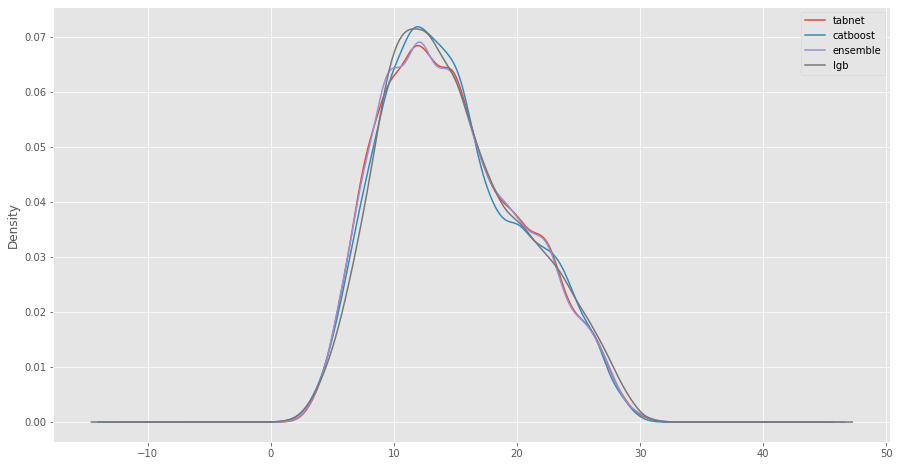

In [ ]:
for c in pred_df.columns:
  pred_df[c].plot(kind='kde', figsize=(15, 8))
plt.legend(pred_df.columns)

plt.show()

<AxesSubplot:>

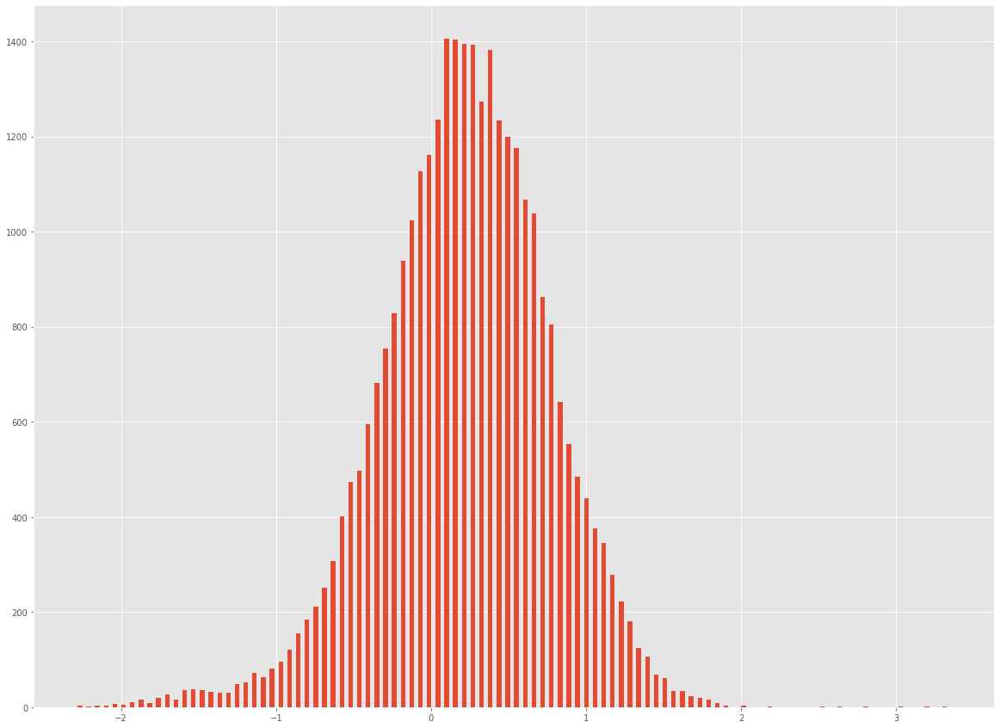

In [ ]:
pred_df['tabnet_residual'] = pred_df['ensemble'] - pred_df['tabnet']
pred_df['tabnet_residual'].hist(bins=100, width=0.03, figsize=(20, 15))

residual from - 0.2 to 0.5

In [ ]:
train_raw['startdate'] = pd.to_datetime(train_raw['startdate'])
train_raw['month'] = train_raw['startdate'].dt.month
trial = train_raw[(train_raw['month'] == 11) | (train_raw['month'] == 12)]

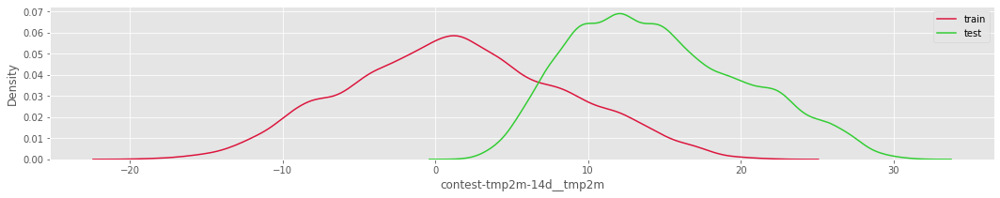

In [ ]:
plt.figure(figsize = (18, 3))
    
sns.kdeplot(trial[target], color = 'crimson', label='train')
sns.kdeplot(pred_df['ensemble'], color = 'limegreen', label='test')

plt.legend()
plt.show()

In [ ]:
train_df.columns

Index(['index', 'lat', 'lon', 'startdate',
       'contest-pevpr-sfc-gauss-14d__pevpr', 'nmme0-tmp2m-34w__cancm30',
       'nmme0-tmp2m-34w__cancm40', 'nmme0-tmp2m-34w__ccsm30',
       'nmme0-tmp2m-34w__ccsm40', 'nmme0-tmp2m-34w__cfsv20',
       ...
       'wind-vwnd-925-2010-11', 'wind-vwnd-925-2010-12',
       'wind-vwnd-925-2010-13', 'wind-vwnd-925-2010-14',
       'wind-vwnd-925-2010-15', 'wind-vwnd-925-2010-16',
       'wind-vwnd-925-2010-17', 'wind-vwnd-925-2010-18',
       'wind-vwnd-925-2010-19', 'wind-vwnd-925-2010-20'],
      dtype='object', length=246)

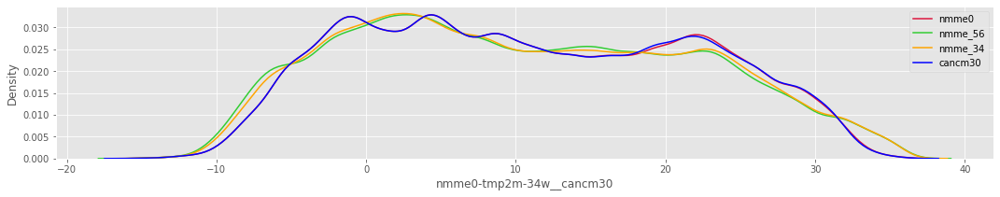

In [ ]:
plt.figure(figsize = (18, 3))
    
sns.kdeplot(train_df['nmme0-tmp2m-34w__cancm30'], color = 'crimson', label='nmme0')
sns.kdeplot(train_df['nmme-tmp2m-56w__cancm3'], color = 'limegreen', label='nmme_56')
sns.kdeplot(train_df['nmme-tmp2m-34w__cancm3'], color = 'orange', label='nmme_34')
sns.kdeplot(train_df['cancm30'], color = 'blue', label='cancm30')
plt.legend()
plt.show()

In [ ]:
x = train_df[['startdate', 'nmme0-tmp2m-34w__cancm30', 'nmme-tmp2m-56w__cancm3', 'nmme-tmp2m-34w__cancm3', 'cancm30', 'contest-tmp2m-14d__tmp2m']]
x.loc[:40, :]

,startdate,nmme0-tmp2m-34w__cancm30,nmme-tmp2m-56w__cancm3,nmme-tmp2m-34w__cancm3,cancm30,contest-tmp2m-14d__tmp2m
0,9/1/14,29.02,28.30,27.83,30.18,28.744480
1,9/2/14,29.02,28.30,27.83,30.18,28.370585
2,9/3/14,29.02,28.30,27.83,30.18,28.133059
3,9/4/14,29.02,28.30,27.83,30.18,28.256798
4,9/5/14,29.02,28.30,27.83,30.18,28.372353
5,9/6/14,29.02,27.83,27.83,29.02,28.523149
6,9/7/14,29.02,27.83,27.83,29.02,28.451247
7,9/8/14,29.02,27.83,27.83,29.02,28.313029
8,9/9/14,29.02,27.83,27.83,29.02,28.123519
9,9/10/14,29.02,27.83,27.83,29.02,27.885300


In [ ]:
train_df['cancm30'].value_counts()

24.49    336
3.24     330
24.39    308
1.36     308
9.36     308
        ... 
32.31      5
33.20      5
34.49      5
29.81      5
32.03      5
Name: cancm30, Length: 4048, dtype: int64